In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image
import numpy as np
%matplotlib inline

findChessBoardCorners for ./camera_cal/calibration1.jpg failed
findChessBoardCorners for ./camera_cal/calibration4.jpg failed
findChessBoardCorners for ./camera_cal/calibration5.jpg failed


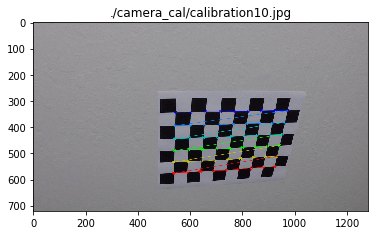

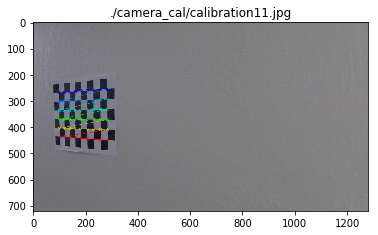

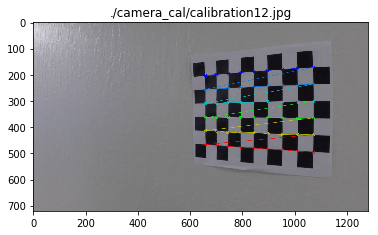

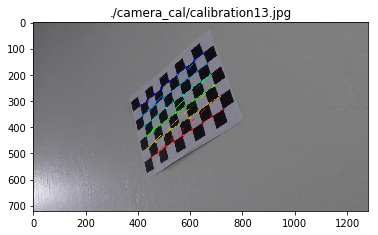

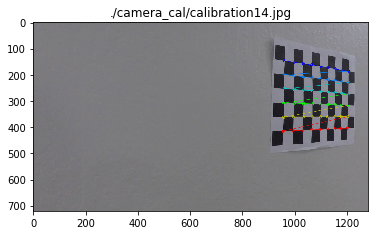

...

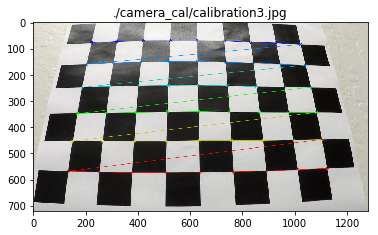

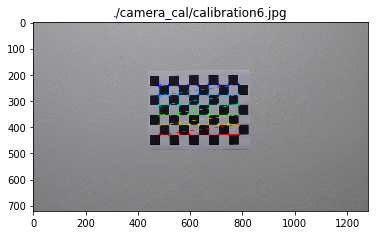

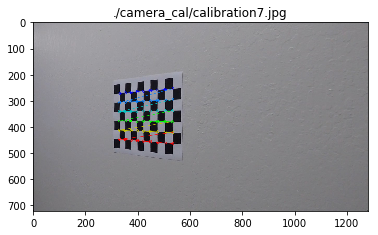

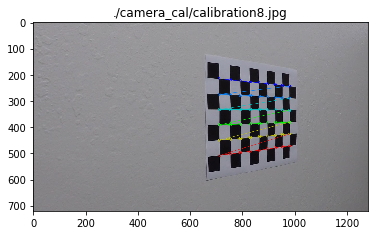

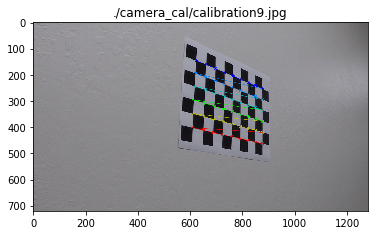

In [2]:
# Camera Calibration
import CalibrateCamera
files = os.listdir('./camera_cal')
files = [ './camera_cal/{}'.format(file) for file in files ]
calibrate = CalibrateCamera.Calibrate(files)

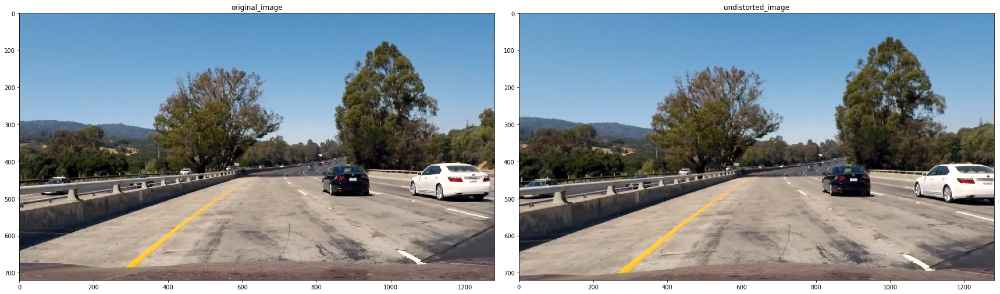

In [3]:
import ImagePlotter

# undistort
plotter = ImagePlotter.ImagePlotter(2, grid=(1,2), figsize=(24, 9))
image = matplotlib.image.imread('test_images/test1.jpg')
plotter(image, "original_image")
image = calibrate(image)
plotter(image, "undistorted_image")

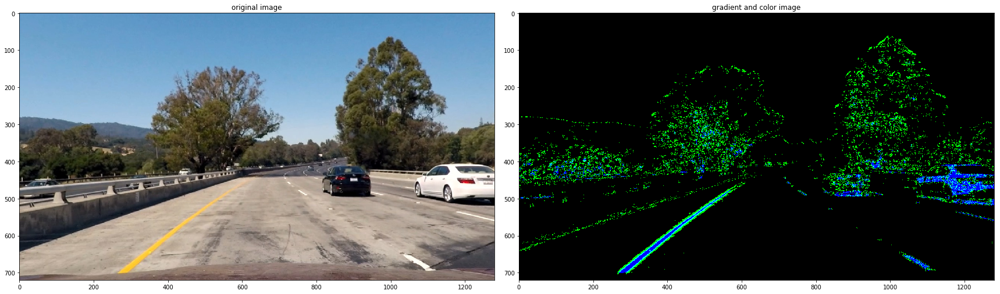

In [4]:
import Pipeline
import ImagePlotter

plotter = ImagePlotter.ImagePlotter(2, grid=(1,2), figsize=(24, 9))
image = matplotlib.image.imread('test_images/test1.jpg')
image = calibrate(image)
plotter(image, 'original image')
plotter(Pipeline.GradientPipeline()(image, stacked=True), "gradient and color image")

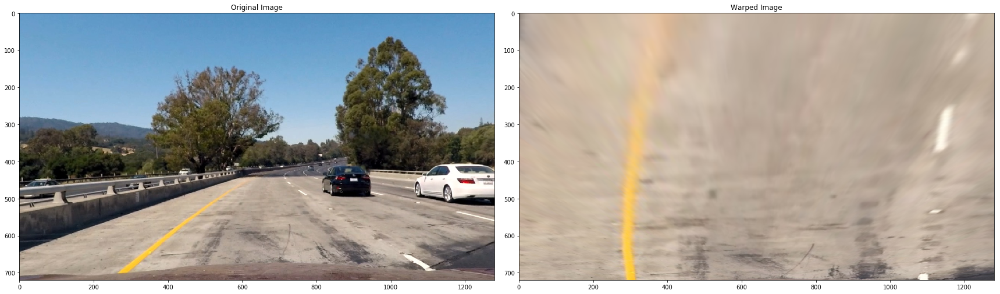

In [5]:
import Pipeline
import ImagePlotter

plotter = ImagePlotter.ImagePlotter(2, grid=(1,2), figsize=(24, 9))
image = matplotlib.image.imread('test_images/test1.jpg')
image = calibrate(image)
plotter(image, 'Original Image')
plotter(Pipeline.Warper().warp(image), "Warped Image")

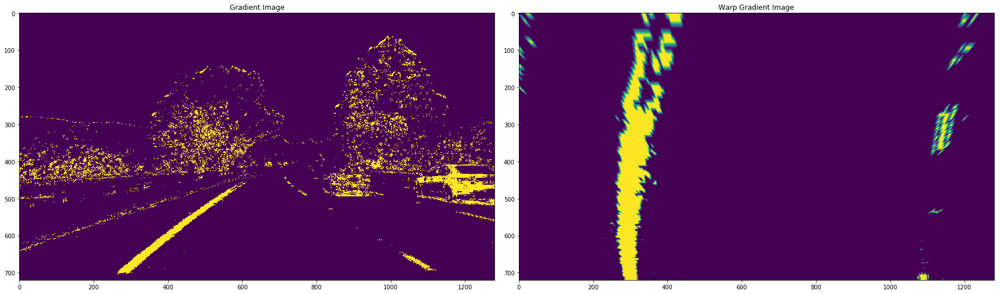

In [6]:
import Pipeline
import ImagePlotter

plotter = ImagePlotter.ImagePlotter(2, grid=(1,2), figsize=(24, 9))
image = matplotlib.image.imread('test_images/test1.jpg')
image = calibrate(image)
image = Pipeline.GradientPipeline()(image)
plotter(image, 'Gradient Image')
image = Pipeline.Warper().warp(image)
plotter(image, "Warp Gradient Image")

In [7]:
image.shape

(720, 1280)

/Users/mahidhar/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


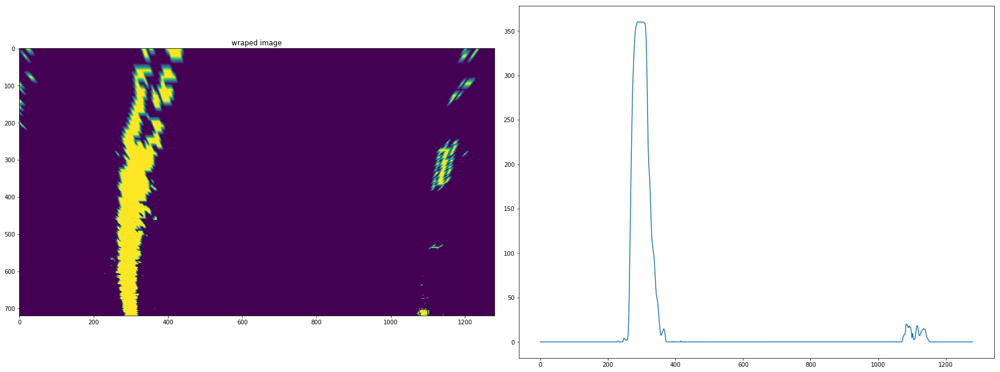

In [8]:
import numpy as np
import Pipeline
import ImagePlotter

plotter = ImagePlotter.ImagePlotter(2, grid=(1,2), figsize=(24, 9))
image = matplotlib.image.imread('test_images/test1.jpg')
image = calibrate(image)
image = Pipeline.GradientWarpPipeline()(image)
plotter(image, 'wraped image')
histogram = np.sum(image[image.shape[0]/2:,:], axis=0)
plt.plot(histogram)

/Users/mahidhar/courses/udacity/sdc/CarND-Advanced-Lane-Lines/LaneFinder.py:70: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  histogram = np.sum(image[self._height/2:, :], axis=0)


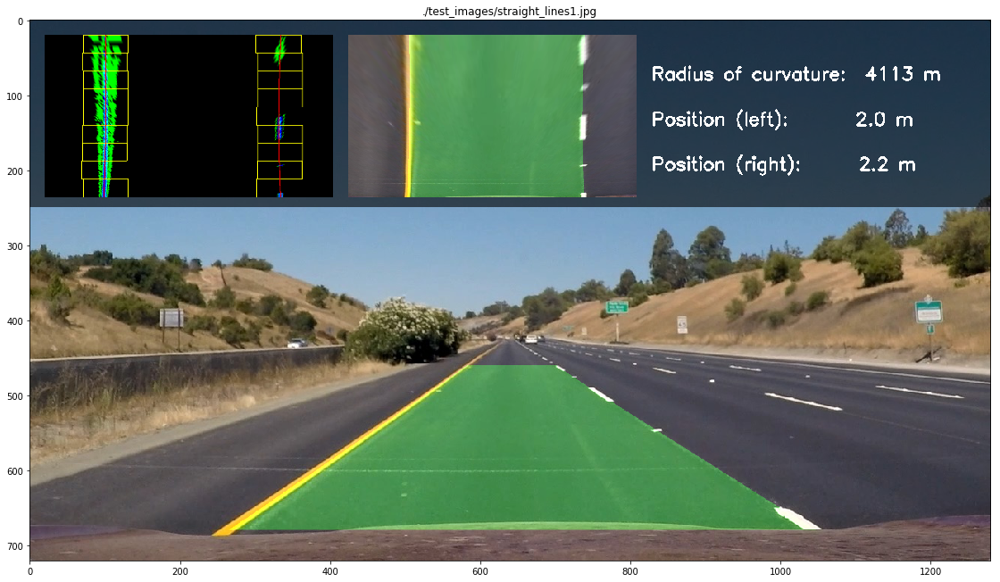

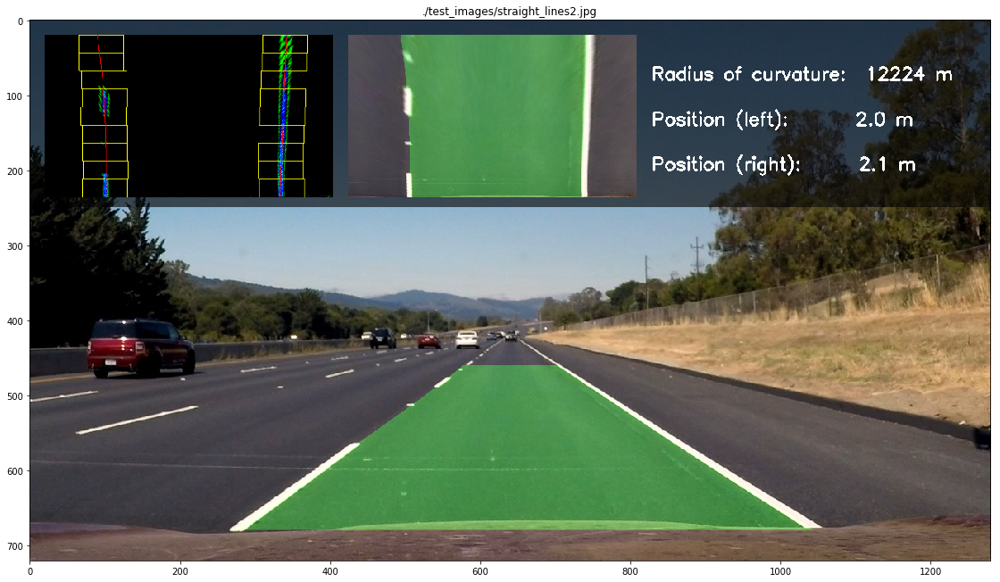

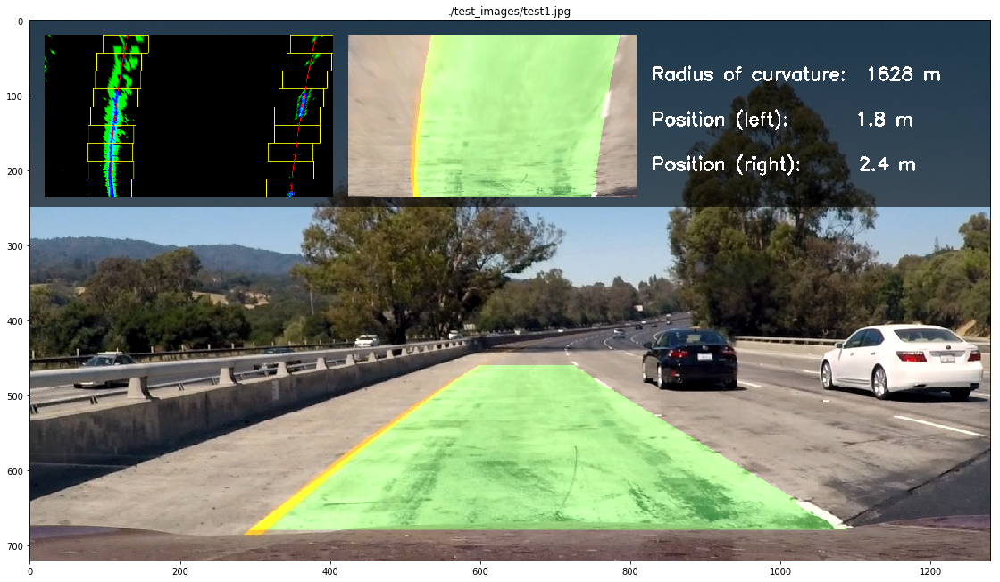

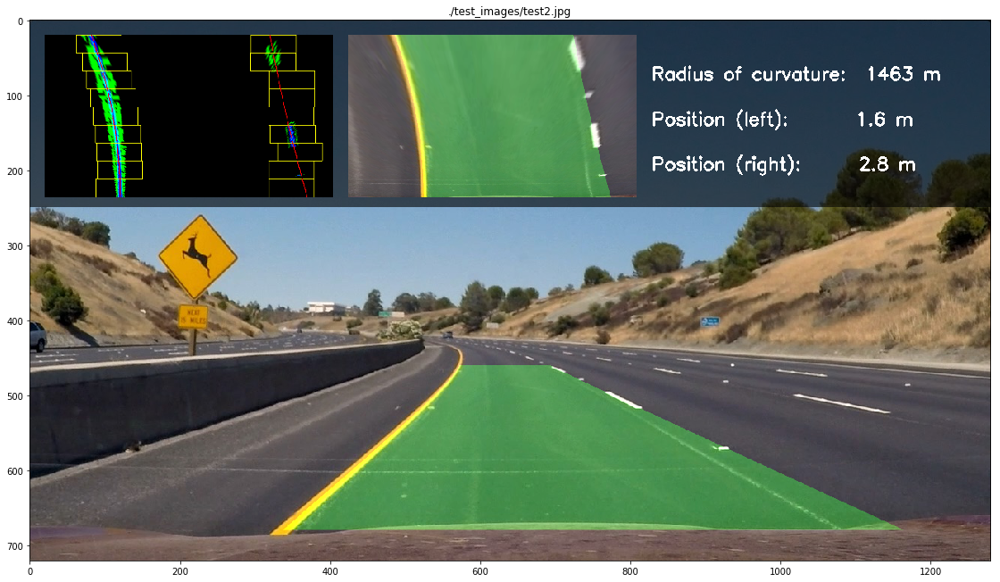

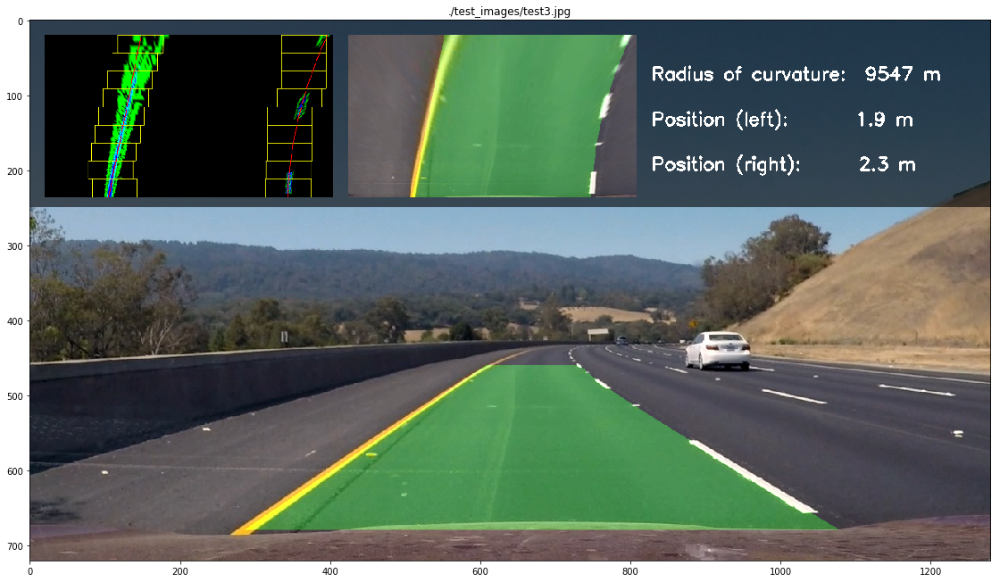

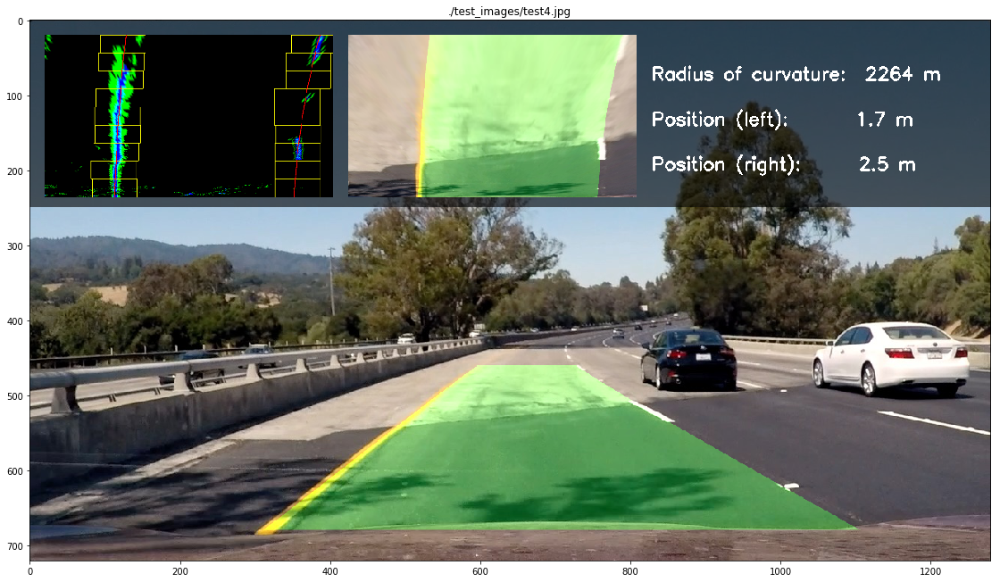

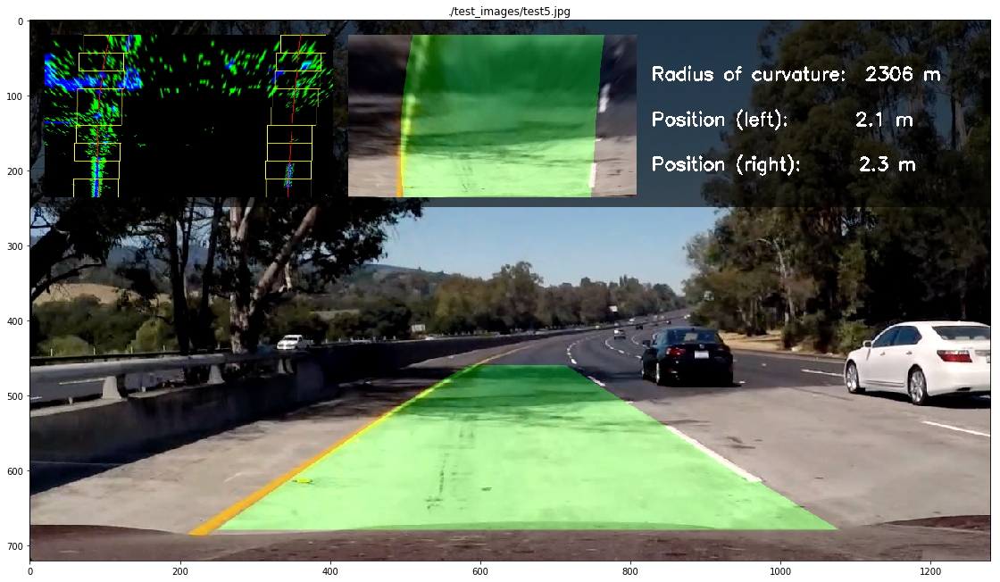

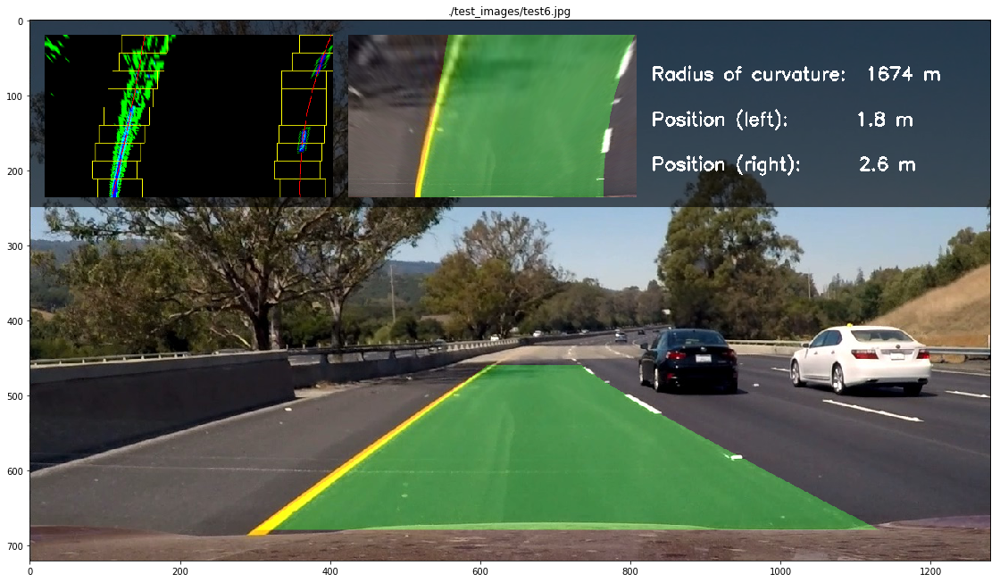

In [10]:
from LaneFinder import LaneFinder
from ImagePlotter import ImagePlotter
files = os.listdir('./test_images')
files = [ './test_images/{}'.format(file) for file in files ]
for file in files:
    image = matplotlib.image.imread(file)
    finder = LaneFinder(calibrate(image))
    image = finder.find_lanes(image)
    plotter = ImagePlotter(figsize=(24, 9))
    plotter(image, title=file)
    

In [11]:
from moviepy.editor import VideoFileClip

video_output_name = 'project_video_annotated.mp4'
video = VideoFileClip("project_video.mp4")
finder = LaneFinder(calibrate(video.get_frame(0)))
video_output = video.fl_image(finder.find_lanes)
%time video_output.write_videofile(video_output_name, audio=False)

[MoviePy] >>>> Building video project_video_annotated.mp4
[MoviePy] Writing video project_video_annotated.mp4


100%|█████████▉| 1260/1261 [09:10<00:00,  2.39it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_annotated.mp4 

CPU times: user 8min 51s, sys: 2min 56s, total: 11min 47s
Wall time: 9min 10s


In [12]:
from moviepy.editor import VideoFileClip

video_output_name = 'challenge_video_annotated.mp4'
video = VideoFileClip("challenge_video.mp4")
finder = LaneFinder(calibrate(video.get_frame(0)))
video_output = video.fl_image(finder.find_lanes)
%time video_output.write_videofile(video_output_name, audio=False)

[MoviePy] >>>> Building video challenge_video_annotated.mp4
[MoviePy] Writing video challenge_video_annotated.mp4


100%|██████████| 485/485 [03:23<00:00,  2.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_annotated.mp4 

CPU times: user 3min 15s, sys: 1min 8s, total: 4min 24s
Wall time: 3min 24s
